In [33]:
library(tidyverse)
library(cowplot)
library(scales)
library(GGally)
library(ggplot2)
library(tidymodels)

In [34]:
url <- "https://raw.githubusercontent.com/werehappy/DSCI-Group-Project-26-/main/data/abalone.data?token=GHSAT0AAAAAACMWOZIHUWO6UOVI7KO6MIFAZPH6NHQ"
download.file(url, "data/abalone_data.csv")
abalone_data <- read_delim("data/abalone_data.csv", delim = ",")
colnames(abalone_data) <- c("Sex", "Length", "Diameter", 
                      "Height", "Whole_weight", "Shucked_weight", "Visera_weight", "Shell_weight", "Rings")
abalone_data

Rows: 4176 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): M
dbl (8): 0.455, 0.365, 0.095, 0.514, 0.2245, 0.101, 0.15, 15

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Visera_weight,Shell_weight,Rings
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7
I,0.425,0.300,0.095,0.3515,0.1410,0.0775,0.120,8
F,0.530,0.415,0.150,0.7775,0.2370,0.1415,0.330,20
F,0.545,0.425,0.125,0.7680,0.2940,0.1495,0.260,16
M,0.475,0.370,0.125,0.5095,0.2165,0.1125,0.165,9
F,0.550,0.440,0.150,0.8945,0.3145,0.1510,0.320,19


In [35]:
abalone_filtered_fct <- abalone_data |> mutate(Sex = as_factor(Sex)) |> 
mutate(Sex = fct_recode(Sex, "Male" = "M", "Female" = "F", "Infant" = "I")) |> select(Sex:Whole_weight)
abalone_filtered_fct

Sex,Length,Diameter,Height,Whole_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.350,0.265,0.090,0.2255
Female,0.530,0.420,0.135,0.6770
Male,0.440,0.365,0.125,0.5160
Infant,0.330,0.255,0.080,0.2050
Infant,0.425,0.300,0.095,0.3515
Female,0.530,0.415,0.150,0.7775
Female,0.545,0.425,0.125,0.7680
Male,0.475,0.370,0.125,0.5095
Female,0.550,0.440,0.150,0.8945


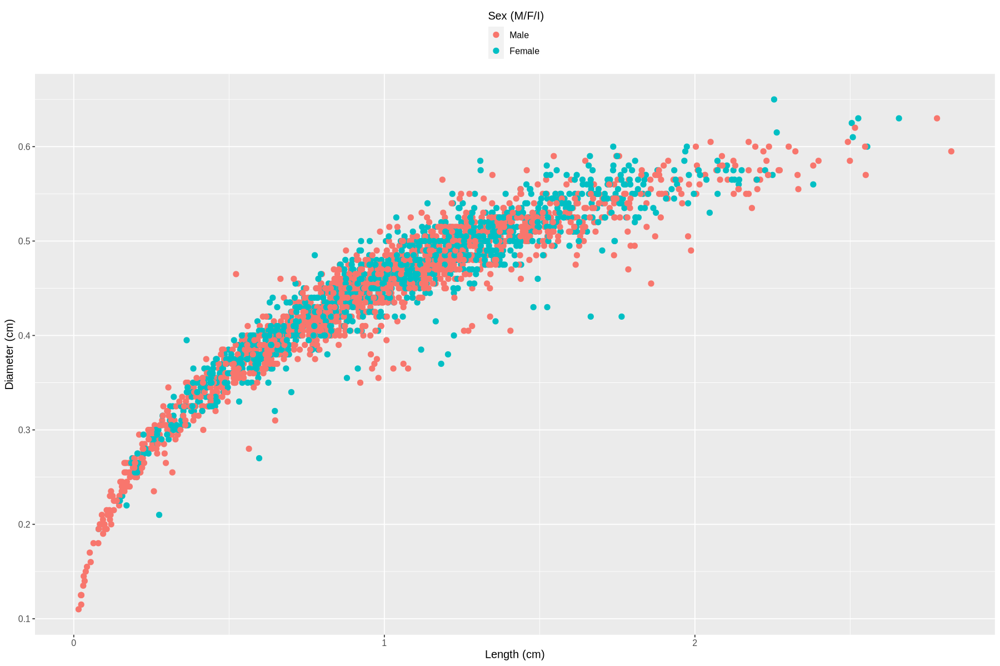

In [36]:
options(repr.plot.width = 15, repr.plot.height = 10)

abalone_no_infant <- abalone_filtered_fct |> filter(Sex != "Infant")

abalone_no_infant |>
    ggplot(aes(x = Whole_weight, 
               y = Diameter, 
               colour = Sex)) +
        labs(x = "Length (cm)",
             y = "Diameter (cm)",
            colour = 'Sex (M/F/I)') +
        geom_point(size = 2.5) +
        theme(text = element_text(size = 12),
        legend.position = "top",
        legend.direction = "vertical")

In [37]:
# Ploting all considered va
#ggpairs(abalone_no_infant, columns = 2:5, ggplot2::aes(colour = Sex , alpha = 0.5)) 

In [38]:
abalone_split <- initial_split(abalone_filtered_fct, prop = 0.75, strata = Sex)
abalone_train <- training(abalone_split) #visualise!!
abalone_test <- testing(abalone_split)

In [50]:
abalone_train

Sex,Length,Diameter,Height,Whole_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Female,0.530,0.415,0.150,0.7775
Female,0.550,0.440,0.150,0.8945
Female,0.525,0.380,0.140,0.6065
Female,0.535,0.405,0.145,0.6845
Female,0.470,0.355,0.100,0.4755
Female,0.565,0.440,0.155,0.9395
Female,0.550,0.415,0.135,0.7635
Female,0.615,0.480,0.165,1.1615
Female,0.560,0.440,0.140,0.9285


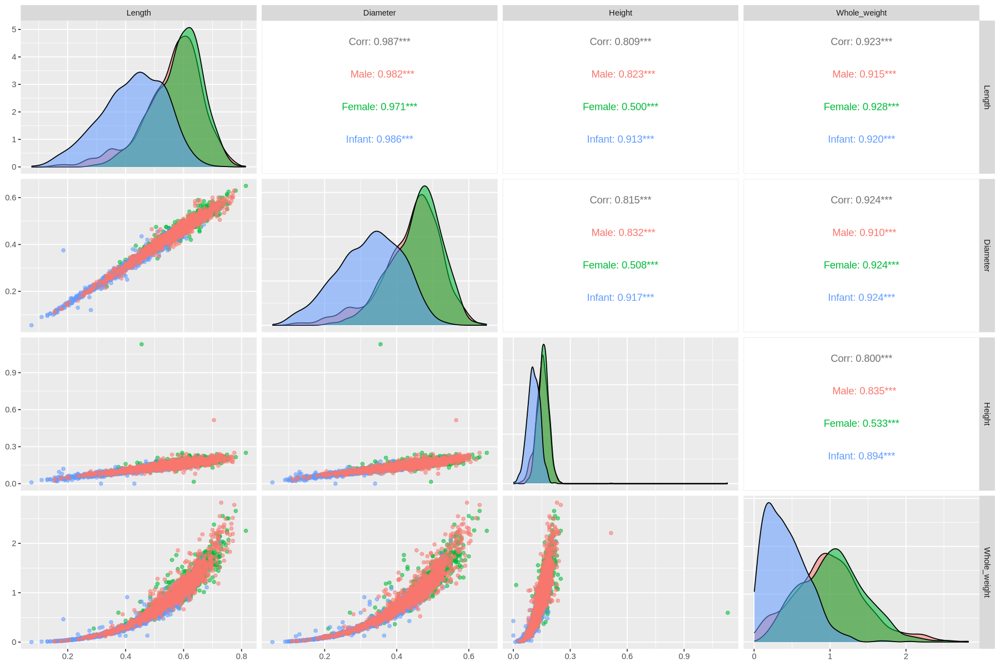

In [39]:
ggpairs(abalone_train, columns = 2:5, ggplot2::aes(colour = Sex , alpha = 0.5))
#Is the scatterplot graph looking ok? (Not Messy?) How to fix
#Scatterplot and Area Chart

**From Below, This is a training code**

In [40]:
abalone_proportions <- abalone_train |>
                      group_by(Sex) |>
                      summarize(n = n()) |>
                      mutate(percent = 100*n/nrow(abalone_train))

abalone_proportions

Sex,n,percent
<fct>,<int>,<dbl>
Male,1145,36.56979
Female,980,31.29990
Infant,1006,32.13031


In [41]:
abalone_recipe <- recipe(Sex ~ Length + Diameter + Height + Whole_weight, data = abalone_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

In [42]:
knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = 5) |>
  set_engine("kknn") |>
  set_mode("classification")

knn_fit <- workflow() |>
  add_recipe(abalone_recipe) |>
  add_model(knn_spec) |>
  fit(data = abalone_train)

knn_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────

Call:
kknn::train.kknn(formula = ..y ~ ., data = data, ks = min_rows(5,     data, 5), kernel = ~"rectangular")

Type of response variable: nominal
Minimal misclassification: 0.4787608
Best kernel: rectangular
Best k: 5

In [43]:
abalone_test_predictions <- predict(knn_fit, abalone_test) |>
  bind_cols(abalone_test)

abalone_test_predictions

.pred_class,Sex,Length,Diameter,Height,Whole_weight
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Infant,Female,0.530,0.420,0.135,0.6770
Male,Male,0.440,0.365,0.125,0.5160
Infant,Infant,0.330,0.255,0.080,0.2050
Infant,Female,0.545,0.425,0.125,0.7680
Female,Male,0.490,0.380,0.135,0.5415
Infant,Infant,0.355,0.280,0.085,0.2905
Infant,Female,0.440,0.340,0.100,0.4510
Female,Female,0.580,0.450,0.185,0.9955
Female,Male,0.590,0.445,0.140,0.9310


In [44]:
abalone_test_predictions |>
  metrics(truth = Sex, estimate = .pred_class) |>
  filter(.metric == "accuracy")

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,multiclass,0.5014354


In [45]:
abalone_test_predictions |> pull(Sex) |> levels()

[1] "Male"   "Female" "Infant"

In [46]:
abalone_test_predictions |>
  precision(truth = Sex, estimate = .pred_class, event_level = "first")

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
precision,macro,0.4948489


In [47]:
abalone_test_predictions |>
  recall(truth = Sex, estimate = .pred_class, event_level = "first")

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
recall,macro,0.5041402


In [48]:
confusion <- abalone_test_predictions |>
             conf_mat(truth = Sex, estimate = .pred_class)
confusion

#Using this Value, calculate the accuracy, precision, and recall

          Truth
Prediction Male Female Infant
    Male    160    147     52
    Female  140    125     45
    Infant   82     55    239

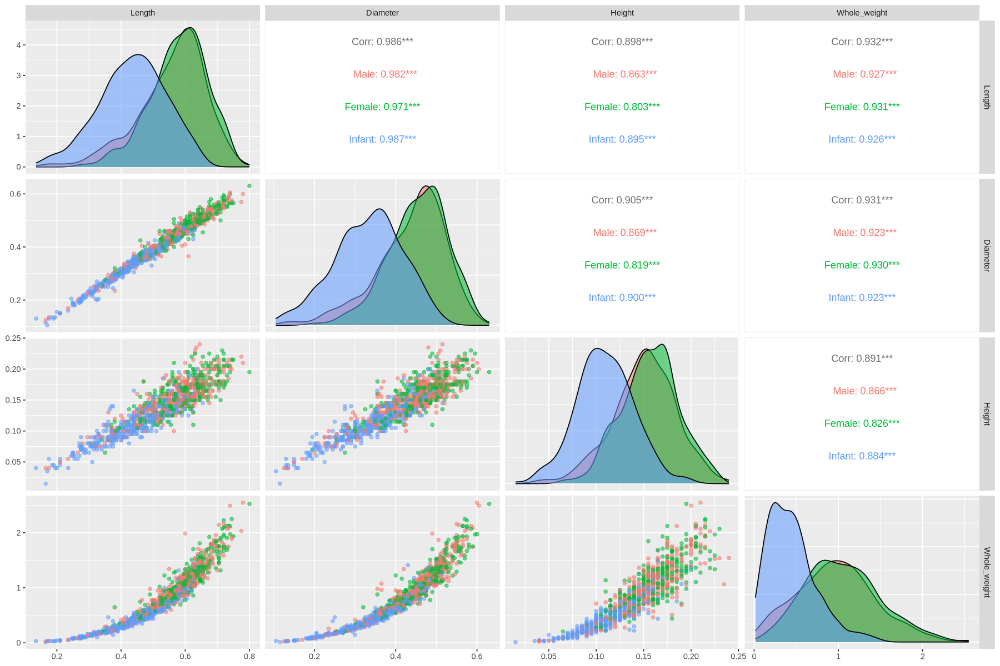

In [49]:
ggpairs(abalone_test_predictions, columns = 3:6 , ggplot2::aes(colour = Sex , alpha = 0.5)) 